# **Soal Praktikum Overfitting Handling #2**

## Kegiatan 1 **(Individu)** 
70 poin

**Peraturan :**
* Tidak boleh ada error dalam kode program
* Dalam modul ini tidak diperbolehkan menggunakan teknik transfer learning dari pretrain model baik yang di bangun sendiri atau anda dapatkan dari sumber lain (tensorflow, keras, dan sebagainya)
* Perhatikan langkah demi langkah yang diperintahkan dalam kegiatan ini

### **SOAL 1 :** 
---
Dalam mendefinisikan model Machine Learing ada banyak cara untuk mendapatkan model dengan performa terbaik salah satunya adalah hyperparameter tuning. Contoh hyperparameter tuning telah diberikan dalam materi di modul ini, dalam kegiatan ini telah diberikan sedikit contoh lain untuk mendefinisikan model hyperparameter tuning dengan hparam. **Tugas anda dalam kegiatan modul kali ini adalah membuat model CNN dengan hyperparameter tuning dengan ketentuan wajib sebagai berikut :**
* Menerapkan materi dari modul-modul sebelumnya (modul 2 dan 3)
* **Menggunakan image disease dataset (bebas dari sumber mana saja)**
* Menggunakan dataset dengan jumlah minimal 5000 data
* Lakukan eksperimen model untuk mencari model CNN dengan performa terbaik untuk mengklasifikasikan dataset yang anda gunakan.
* Definisikan minimal 2 model CNN dengan komposisi parameter yang berbeda-beda.
* Masing-masing model memiliki **minimal** 50 epoch.
* Dalam mendefinisikan model, WAJIB melakukan tuning minimal pada 3 parameter model yang dirubah misalnya merubah jumlah neuron, nilai dropout, nilai lerning rate, jenis optimizer, jenis activation function dsb.
* Visualisasikan hasil evaluasi performa model. Anda dapat menggunakan plot pada umumnya seperti grafik loss dan accuracy dengan matplotib atau visualisasi interaktif menggunakan tensorboard seperti pada contoh dibawah.



# Download Dataset

In [ ]:
# Tulis Program Anda Disini!
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import zipfile

In [ ]:
os.environ['KAGGLE_CONFIG_DIR'] = "/content/drive/MyDrive/1. Colab Notebooks/Kaggle"

In [ ]:
!kaggle datasets download -d anaselmasry/covid19normalpneumonia-ct-images

 99% 927M/936M [00:08<00:00, 134MB/s]
100% 936M/936M [00:08<00:00, 114MB/s]


In [ ]:
!mv "/content/covid19normalpneumonia-ct-images.zip" "/content/drive/MyDrive/1. Colab Notebooks/semester 7/Pembelajaran Mesin/kegiatan praktikum (benar)/modul 4/Dataset"

In [ ]:
%cd /content/drive/MyDrive/1. Colab Notebooks/semester 7/Pembelajaran Mesin/kegiatan praktikum (benar)/modul 4/Dataset

/content/drive/MyDrive/1. Colab Notebooks/semester 7/Pembelajaran Mesin/kegiatan praktikum (benar)/modul 4/Dataset


In [ ]:
!ls

covid19normalpneumonia-ct-images.zip


In [ ]:
# Ekstrak dataset
import os
import zipfile

local_zip = "/content/drive/MyDrive/1. Colab Notebooks/semester 7/Pembelajaran Mesin/kegiatan praktikum (benar)/modul 4/Dataset/covid19normalpneumonia-ct-images.zip"
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/content/drive/MyDrive/1. Colab Notebooks/semester 7/Pembelajaran Mesin/kegiatan praktikum (benar)/modul 4/Dataset')
zip_ref.close()

**Split Dataset**

In [ ]:
!pip install split_folders
import splitfolders

In [ ]:
input = '/content/drive/MyDrive/1. Colab Notebooks/semester 7/Pembelajaran Mesin/kegiatan praktikum (benar)/modul 4/Dataset'
output = '/content/drive/MyDrive/1. Colab Notebooks/semester 7/Pembelajaran Mesin/kegiatan praktikum (benar)/modul 4/splitted dataset'
splitfolders.ratio(input, output = output, seed=42, ratio=(.80, .19, .01))

Copying files: 7544 files [02:19, 54.03 files/s]


In [ ]:
import os
splited_dataset = '/content/drive/MyDrive/1. Colab Notebooks/semester 7/Pembelajaran Mesin/kegiatan praktikum (benar)/modul 4/splitted dataset'

train_dir = os.path.join(splited_dataset, 'train')
norm_train_dir = os.path.join(train_dir, 'normal')
pneu_train_dir = os.path.join(train_dir, 'pneumonia')
covid_train_dir = os.path.join(train_dir, 'covid')

val_dir = os.path.join(splited_dataset, 'val')
norm_val_dir = os.path.join(val_dir, 'normal')
pneu_val_dir = os.path.join(val_dir, 'pneumonia')
covid_val_dir = os.path.join(val_dir, 'covid')

test_dir = os.path.join(splited_dataset, 'test')
norm_test_dir = os.path.join(test_dir, 'normal')
pneu_test_dir = os.path.join(test_dir, 'pneumonia')
covid_test_dir = os.path.join(test_dir, 'covid')

In [ ]:
print("Total Training NORMAL:", len(os.listdir(norm_train_dir)))
print("Total Training PNEUMONIA:", len(os.listdir(pneu_train_dir)))
print("Total Training COVID:", len(os.listdir(covid_train_dir)))

print('---------------------------------------------------------')
print("Total validation NORMAL:", len(os.listdir(norm_val_dir)))
print("Total validation PNEUMONIA:", len(os.listdir(pneu_val_dir)))
print("Total validation COVID:", len(os.listdir(covid_val_dir)))

print('---------------------------------------------------------')
print("Total Testing NORMAL:", len(os.listdir(norm_test_dir)))
print("Total Testing PNEUMONIA:", len(os.listdir(pneu_test_dir)))
print("Total Testing COVID:", len(os.listdir(covid_test_dir)))


Total Training NORMAL: 1695
Total Training PNEUMONIA: 2712
Total Training COVID: 1628
---------------------------------------------------------
Total validation NORMAL: 402
Total validation PNEUMONIA: 644
Total validation COVID: 386
---------------------------------------------------------
Total Testing NORMAL: 22
Total Testing PNEUMONIA: 34
Total Testing COVID: 21


**Import Library yang dibutuhkan**

In [ ]:
import os
import cv2
import numpy as np

import tensorflow as tf
from tensorboard.plugins.hparams import api as hp
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import BatchNormalization, Conv2D, Dense, Dropout, Flatten, InputLayer, MaxPool2D, SeparableConv2D
from tensorflow.keras.optimizers import Adam

import json

In [ ]:
%load_ext tensorboard

In [ ]:
!rm -rf ./logs/ 

# Flow From DIrectory

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
datagen = ImageDataGenerator(rescale=1/255)

train_gen = datagen.flow_from_directory(
    train_dir,
    target_size=(150,150),
    shuffle=True,
    # batch_size = 32,
    class_mode='categorical'
)

val_gen = datagen.flow_from_directory(
    val_dir,
    target_size=(150,150),
    shuffle=False,
    # batch_size = 32,
    class_mode='categorical'
)

test_gen = datagen.flow_from_directory(
    test_dir,
    target_size=(150,150),
    shuffle=False,
    # batch_size = 32,
    class_mode='categorical'
)

Found 6035 images belonging to 3 classes.
Found 1432 images belonging to 3 classes.
Found 77 images belonging to 3 classes.


# HParams

In [ ]:
HP_NUM_UNITS = hp.HParam('num_units', hp.Discrete([32, 64]))
HP_DROPOUT = hp.HParam('dropout', hp.RealInterval(0.3, 0.5))
HP_OPTIMIZER = hp.HParam('optimizer', hp.Discrete(['adam', 'adadelta']))

METRIC_ACCURACY = 'accuracy'

hparam_summary_dir = '/content/drive/MyDrive/1. Colab Notebooks/semester 7/Pembelajaran Mesin/kegiatan praktikum (benar)/modul 4/HParams summary'

In [ ]:
first_model_dict = dict()
first_history_dict = dict()

second_model_dict = dict()
second_history_dict = dict()

# Model 1

In [ ]:
# Defined xtest dan ytest
xtest, ytest = zip(*(test_gen[i] for i in range(len(test_gen))))
x_test, y_test = np.vstack(xtest), np.vstack(ytest)

In [ ]:
# Modelling Function

def train_test_first_model(hparams, session_num):
    global first_model_dict
    global first_history_dict

    model = Sequential()

    # Feature Extraction Layer
    model.add(InputLayer(input_shape=[150,150,3]))
    model.add(Conv2D(16, 3, padding='same', activation='relu'))
    model.add(MaxPool2D())
    model.add(Dropout(hparams[HP_DROPOUT]))
    model.add(Flatten())

    # Fully Connected Layer
    model.add(Dense(hparams[HP_NUM_UNITS], activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(3, activation='softmax'))

    # Compile Model
    model.compile(
        optimizer=hparams[HP_OPTIMIZER],
        loss='categorical_crossentropy',
        metrics='accuracy'
    )

    # Fit Model
    H = model.fit(
              train_gen,
              epochs=50,
              validation_data=val_gen,
              # validation_steps=11,
              steps_per_epoch=50
              )
    
    # Gather Model and History
    first_model_dict[session_num] = model
    first_history_dict[session_num] = H.history

    # Evaluate Model
    _, accuracy = model.evaluate(x_test, y_test)

    return accuracy

In [ ]:
def first_model_run(run_dir, hparams, session_num):
    with tf.summary.create_file_writer(run_dir).as_default():
        hp.hparams(hparams)
        accuracy = train_test_first_model(hparams, session_num)
        tf.summary.scalar(METRIC_ACCURACY, accuracy, step=50)

In [ ]:
print(hparam_summary_dir + '/' + "asda")

/content/drive/MyDrive/1. Colab Notebooks/semester 7/Pembelajaran Mesin/kegiatan praktikum (benar)/modul 4/HParams summary/asda


In [ ]:
session_num = 0

for num_units in HP_NUM_UNITS.domain.values:
    for dropout_rate in (HP_DROPOUT.domain.min_value, HP_DROPOUT.domain.max_value):
        for optimizer in HP_OPTIMIZER.domain.values:
            hparams = {
                HP_NUM_UNITS: num_units,
                HP_DROPOUT: dropout_rate,
                HP_OPTIMIZER: optimizer,
            }
            run_name = "first_model_run-%d" % session_num
            print('--- Starting trial: %s' % run_name)
            print({h.name: hparams[h] for h in hparams})
            first_model_run((hparam_summary_dir + '/' + run_name), hparams, session_num)
            session_num += 1

--- Starting trial: first_model_run-0
{'num_units': 32, 'dropout': 0.3, 'optimizer': 'adadelta'}
Epoch 1/50
50/50 [==============================] - 929s 19s/step - loss: 1.0955 - accuracy: 0.4281 - val_loss: 1.0486 - val_accuracy: 0.4525
Epoch 2/50
50/50 [==============================] - 373s 7s/step - loss: 1.0577 - accuracy: 0.4400 - val_loss: 1.0326 - val_accuracy: 0.4560
Epoch 3/50
50/50 [==============================] - 273s 5s/step - loss: 1.0377 - accuracy: 0.4423 - val_loss: 1.0112 - val_accuracy: 0.4574
Epoch 4/50
50/50 [==============================] - 209s 4s/step - loss: 1.0350 - accuracy: 0.4613 - val_loss: 0.9969 - val_accuracy: 0.4811
Epoch 5/50
50/50 [==============================] - 158s 3s/step - loss: 1.0113 - accuracy: 0.4756 - val_loss: 0.9766 - val_accuracy: 0.4658
Epoch 6/50
50/50 [==============================] - 127s 3s/step - loss: 0.9780 - accuracy: 0.5044 - val_loss: 0.9599 - val_accuracy: 0.4930
Epoch 7/50
50/50 [==============================] - 97s 

In [ ]:
import json

target_dir = '/content/drive/MyDrive/1. Colab Notebooks/semester 7/Pembelajaran Mesin/kegiatan praktikum (benar)/modul 4/HParams summary'

for key, history_dict in first_history_dict.items():
    # simpan history model
    history_name = f"first_model_history_run-{key}.json"
    history_save_dir = os.path.join(target_dir, history_name)
    json.dump(history_dict, open(history_save_dir, 'w'))

for key, trained_model in first_model_dict.items():
    # simpan model dan weight-nya
    trained_model_name = f"first_model_run-{key}.h5"
    trained_model_save_dir = os.path.join(target_dir, trained_model_name)
    
    trained_model_weight_name = f"first_model_weight_run-{key}.h5"
    trained_model_weight_save_dir = os.path.join(target_dir, trained_model_weight_name)
    
    trained_model.save(trained_model_save_dir)
    trained_model.save_weights(trained_model_weight_save_dir)

# Second Model

In [ ]:
def train_test_second_model(hparams, session_num):
    global second_model_dict
    global second_history_dict

    model = Sequential()

    model.add(InputLayer(input_shape=[150,150,3]))
    model.add(Conv2D(16, 3, padding='same', activation='relu'))
    model.add(MaxPool2D())
    model.add(Conv2D(8, 3, padding='same', activation='relu'))
    model.add(Dropout(hparams[HP_DROPOUT]))
    model.add(Flatten())

    # Fully Connected Layer
    model.add(Dense(hparams[HP_NUM_UNITS], activation='relu'))
    model.add(Dropout(0.2)) #ubah
    model.add(Dense(3, activation='softmax'))

    # Compile Model
    model.compile(
        optimizer=hparams[HP_OPTIMIZER],
        loss='categorical_crossentropy',
        metrics='accuracy'
    )

    # Fit Model
    H = model.fit(
              train_gen,
              epochs=50,
              validation_data=val_gen,
              # validation_steps=11,
              steps_per_epoch=40
              )
    
    # Gather Model and History
    second_model_dict[session_num] = model
    second_history_dict[session_num] = H.history

    # Evaluate Model
    _, accuracy = model.evaluate(x_test, y_test)

    return accuracy

In [ ]:
def second_model_run(run_dir, hparams, session_num):
    with tf.summary.create_file_writer(run_dir).as_default():
        hp.hparams(hparams)
        accuracy = train_test_second_model(hparams, session_num)
        tf.summary.scalar(METRIC_ACCURACY, accuracy, step=50)

In [ ]:
session_num = 0

for num_units in HP_NUM_UNITS.domain.values:
    for dropout_rate in (HP_DROPOUT.domain.min_value, HP_DROPOUT.domain.max_value):
        for optimizer in HP_OPTIMIZER.domain.values:
            hparams = {
                HP_NUM_UNITS: num_units,
                HP_DROPOUT: dropout_rate,
                HP_OPTIMIZER: optimizer,
            }
            run_name = "second_model_run-%d" % session_num
            print('--- Starting trial: %s' % run_name)
            print({h.name: hparams[h] for h in hparams})
            second_model_run((hparam_summary_dir + '/' + run_name), hparams, session_num)
            session_num += 1

--- Starting trial: second_model_run-0
{'num_units': 32, 'dropout': 0.3, 'optimizer': 'adadelta'}
Epoch 1/50
40/40 [==============================] - 40s 991ms/step - loss: 1.1053 - accuracy: 0.4016 - val_loss: 1.0566 - val_accuracy: 0.4448
Epoch 2/50
40/40 [==============================] - 39s 974ms/step - loss: 1.0821 - accuracy: 0.4344 - val_loss: 1.0446 - val_accuracy: 0.4469
Epoch 3/50
40/40 [==============================] - 39s 987ms/step - loss: 1.0642 - accuracy: 0.4242 - val_loss: 1.0383 - val_accuracy: 0.4462
Epoch 4/50
40/40 [==============================] - 39s 972ms/step - loss: 1.0542 - accuracy: 0.4523 - val_loss: 1.0224 - val_accuracy: 0.4525
Epoch 5/50
40/40 [==============================] - 39s 968ms/step - loss: 1.0592 - accuracy: 0.4414 - val_loss: 1.0160 - val_accuracy: 0.4700
Epoch 6/50
40/40 [==============================] - 38s 966ms/step - loss: 1.0476 - accuracy: 0.4406 - val_loss: 1.0041 - val_accuracy: 0.4644
Epoch 7/50
40/40 [==========================

In [ ]:
import json

target_dir = '/content/drive/MyDrive/modul 4/chest_xray/hparams_summary'

for key, history_dict in second_history_dict.items():
    # simpan history model
    history_name = f"second_model_history_run-{key}.json"
    history_save_dir = os.path.join(target_dir, history_name)
    # json.dump(history_dict, open(history_save_dir, 'w'))

for key, trained_model in second_model_dict.items():
    # simpan model dan weight-nya
    trained_model_name = f"second_model_run-{key}.h5"
    trained_model_save_dir = os.path.join(target_dir, trained_model_name)
    
    trained_model_weight_name = f"second_model_weight_run-{key}.h5"
    trained_model_weight_save_dir = os.path.join(target_dir, trained_model_weight_name)
    
    trained_model.save(trained_model_save_dir)
    trained_model.save_weights(trained_model_weight_save_dir)

### **SOAL 2 :**

---
Untuk mendapatkan penilaian pada soal ke 2 ini anda **wajib** mengerjakan soal nomer 1 terlebih dahulu. Tunjukkan kepada asisten bahwa anda telah menyelesaikan seluruh soal wajib diatas dan jelaskan dengan sebaik mungkin kepada asisten.


**Poin penilaian**
* Dapat menunjukkan dan menjelaskan hasil evaluasi masing-masing model yang digunakan.
* Dapat memvisualisasikan hasil evaluasi model dan menjelaskannya kepada asisten. 
* Menggunakan maptplotlib atau seaborn untuk visualisasi loss dan accuracy
* Menampilkan hasil evaluasi berupa nilai presisi, akurasi, recall, f1 score dan confusion matrix.
* Menggunakan tensorboard untuk visualisasi hasil evaluasi model menggunakan hyperparameter tuning.
* Menggunakan Hparam untuk tuning model.
* Hasil accuracy model terbaik >= 80% 
* Hasil loss model terbaik < 5%

In [ ]:
import matplotlib.pyplot as plt

import numpy as np

from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

import seaborn as sns

# Evaluasi Model Pertama

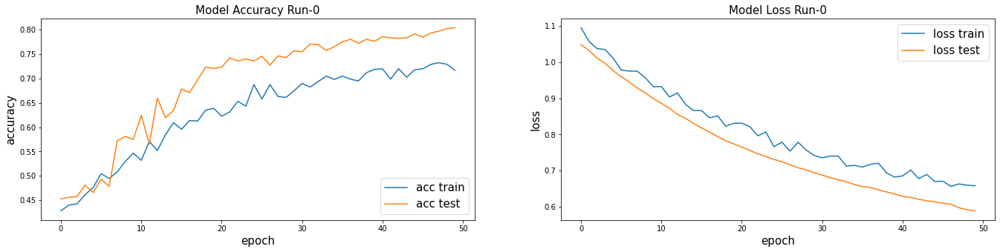

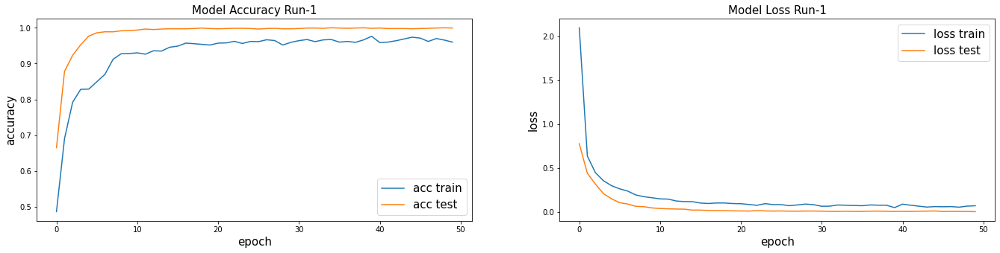

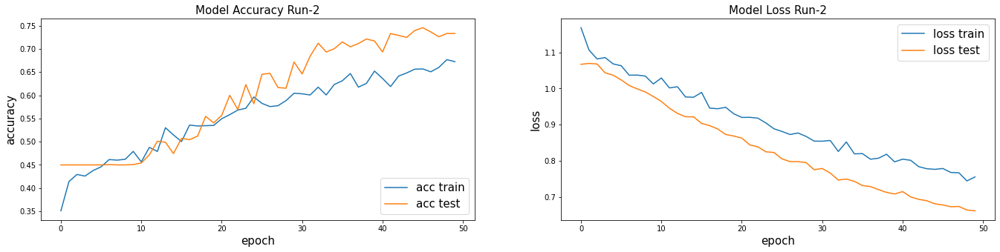

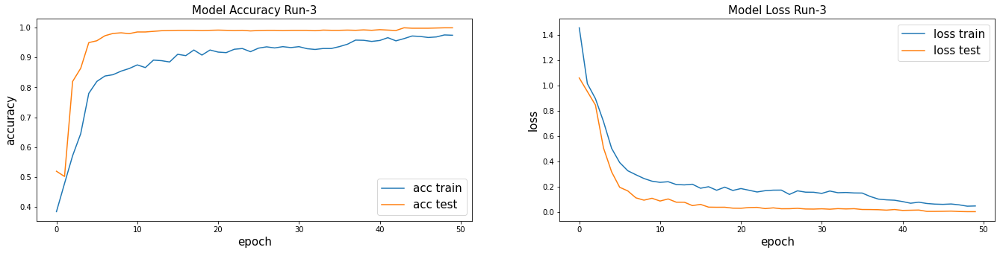

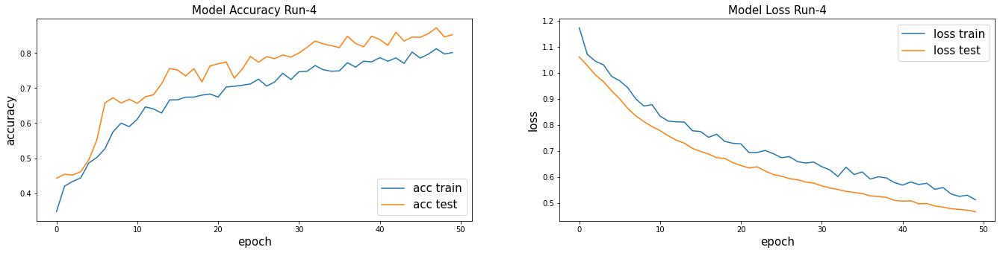

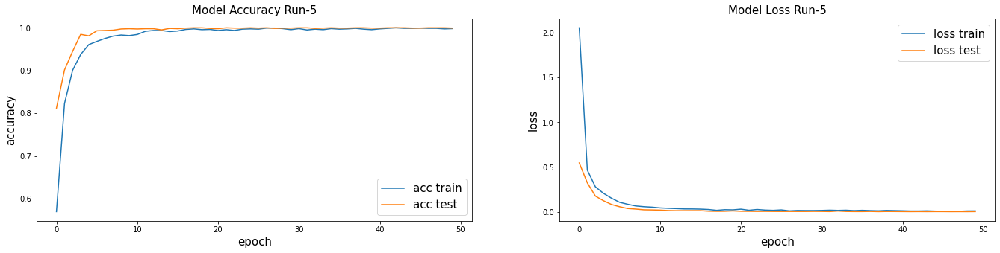

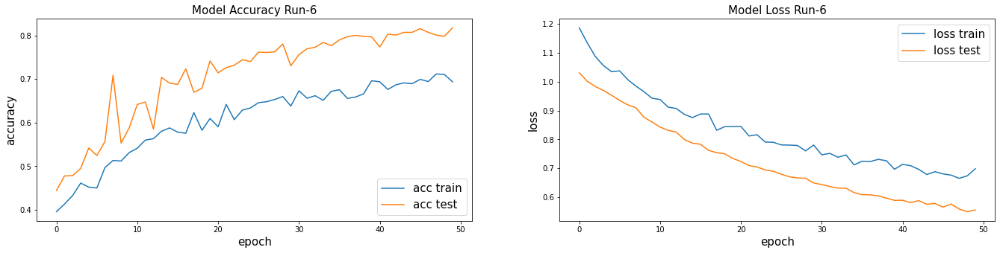

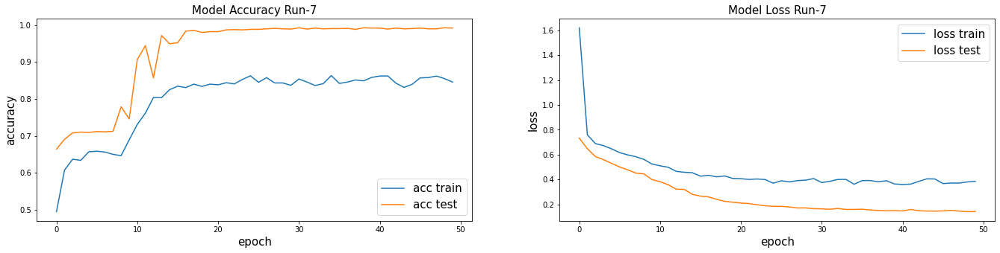

In [ ]:
# Tulis Program Anda Disini!
for key, history_dict in first_history_dict.items():
    plt.figure(figsize = (23,5))

    plt.subplot(1, 2, 1)
    plt.xticks(fontsize='10')
    plt.yticks(fontsize='10')
    plt.plot(history_dict['accuracy'])
    plt.plot(history_dict['val_accuracy'])
    plt.title(f'Model Accuracy Run-{key}', fontsize=15)
    plt.ylabel('accuracy', fontsize=15)
    plt.xlabel('epoch', fontsize=15)
    plt.legend(['acc train', 'acc test'], loc='lower right', fontsize=15)

    plt.subplot(1, 2, 2)
    plt.xticks(fontsize='10')
    plt.yticks(fontsize='10')
    plt.plot(history_dict['loss'])
    plt.plot(history_dict['val_loss'])
    plt.title(f'Model Loss Run-{key}', fontsize=15)
    plt.ylabel('loss', fontsize=15)
    plt.xlabel('epoch', fontsize=15)
    plt.legend(['loss train', 'loss test'], loc='upper right', fontsize=15)
    plt.show()

In [ ]:
for key, trained_model in first_model_dict.items():
        Y_pred = trained_model.predict_generator(test_gen)
        y_pred = np.argmax(Y_pred, axis=1)

        print(f"Model Run-{key}")
        target_names = []

        for key in train_gen.class_indices:
                target_names.append(key)
        print(classification_report(test_gen.classes, y_pred, target_names=target_names))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  


Model Run-0
              precision    recall  f1-score   support

       covid       0.94      0.76      0.84        21
      normal       0.79      0.50      0.61        22
   pneumonia       0.67      0.91      0.78        34

    accuracy                           0.75        77
   macro avg       0.80      0.72      0.74        77
weighted avg       0.78      0.75      0.75        77



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  


Model Run-1
              precision    recall  f1-score   support

       covid       1.00      1.00      1.00        21
      normal       1.00      1.00      1.00        22
   pneumonia       1.00      1.00      1.00        34

    accuracy                           1.00        77
   macro avg       1.00      1.00      1.00        77
weighted avg       1.00      1.00      1.00        77



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  


Model Run-2
              precision    recall  f1-score   support

       covid       0.93      0.67      0.78        21
      normal       0.83      0.45      0.59        22
   pneumonia       0.64      0.94      0.76        34

    accuracy                           0.73        77
   macro avg       0.80      0.69      0.71        77
weighted avg       0.78      0.73      0.72        77



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  


Model Run-3
              precision    recall  f1-score   support

       covid       1.00      1.00      1.00        21
      normal       1.00      1.00      1.00        22
   pneumonia       1.00      1.00      1.00        34

    accuracy                           1.00        77
   macro avg       1.00      1.00      1.00        77
weighted avg       1.00      1.00      1.00        77



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  


Model Run-4
              precision    recall  f1-score   support

       covid       1.00      0.71      0.83        21
      normal       0.93      0.64      0.76        22
   pneumonia       0.70      0.97      0.81        34

    accuracy                           0.81        77
   macro avg       0.88      0.77      0.80        77
weighted avg       0.85      0.81      0.80        77



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  


Model Run-5
              precision    recall  f1-score   support

       covid       1.00      1.00      1.00        21
      normal       1.00      1.00      1.00        22
   pneumonia       1.00      1.00      1.00        34

    accuracy                           1.00        77
   macro avg       1.00      1.00      1.00        77
weighted avg       1.00      1.00      1.00        77



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  


Model Run-6
              precision    recall  f1-score   support

       covid       1.00      0.71      0.83        21
      normal       0.65      0.77      0.71        22
   pneumonia       0.78      0.82      0.80        34

    accuracy                           0.78        77
   macro avg       0.81      0.77      0.78        77
weighted avg       0.80      0.78      0.78        77



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  


Model Run-7
              precision    recall  f1-score   support

       covid       1.00      0.76      0.86        21
      normal       0.81      1.00      0.90        22
   pneumonia       1.00      1.00      1.00        34

    accuracy                           0.94        77
   macro avg       0.94      0.92      0.92        77
weighted avg       0.95      0.94      0.93        77



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  after removing the cwd from sys.path.


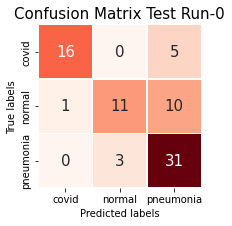

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  after removing the cwd from sys.path.


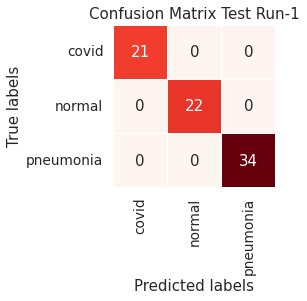

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  after removing the cwd from sys.path.


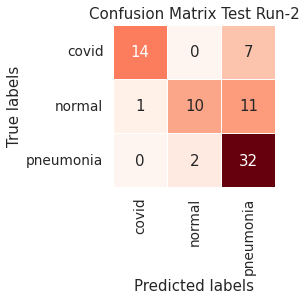

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  after removing the cwd from sys.path.


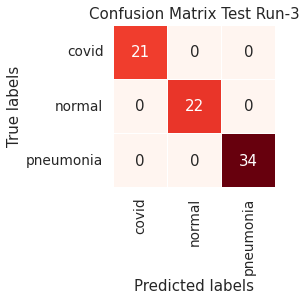

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  after removing the cwd from sys.path.


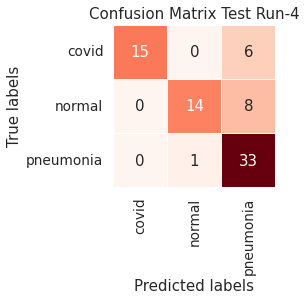

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  after removing the cwd from sys.path.


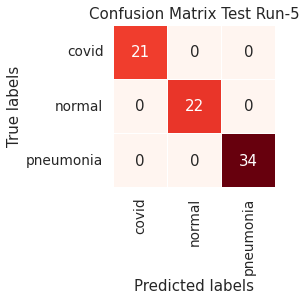

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  after removing the cwd from sys.path.


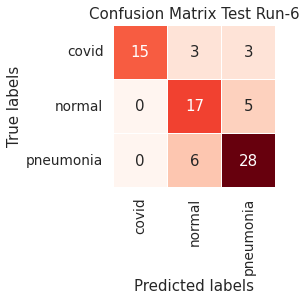

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  after removing the cwd from sys.path.


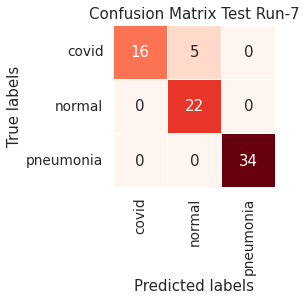

In [ ]:
labels = ['covid', 'normal', 'pneumonia']

for key, trained_model in first_model_dict.items():
    Y_pred = trained_model.predict_generator(test_gen)
    y_pred = np.argmax(Y_pred, axis=1)

    Cmatrix_test = confusion_matrix(test_gen.classes, y_pred)

    plt.figure(figsize=(3,3))
    ax = plt.subplot()

    data = np.asarray(Cmatrix_test).reshape(3,3)

    sns.set(font_scale=1.25)
    sns.heatmap(data,
                annot=True,
                ax=ax,
                cmap=plt.cm.Reds,
                square=True,
                cbar=False,
                linewidths=.5,
                xticklabels=labels, yticklabels=labels
                )

    ax.set_xlabel('Predicted labels')
    ax.set_ylabel('True labels')
    ax.set_title('Confusion Matrix')
    plt.title(f'Confusion Matrix Test Run-{key}')
    plt.show()

# Evaluasi Model Kedua

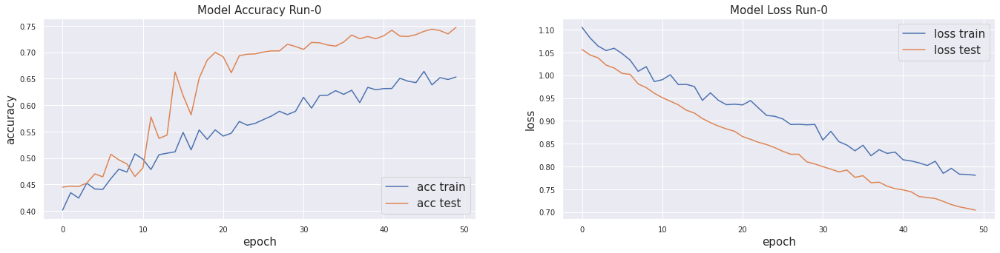

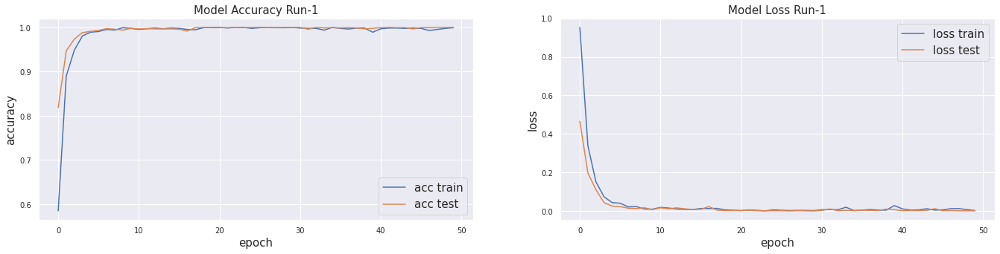

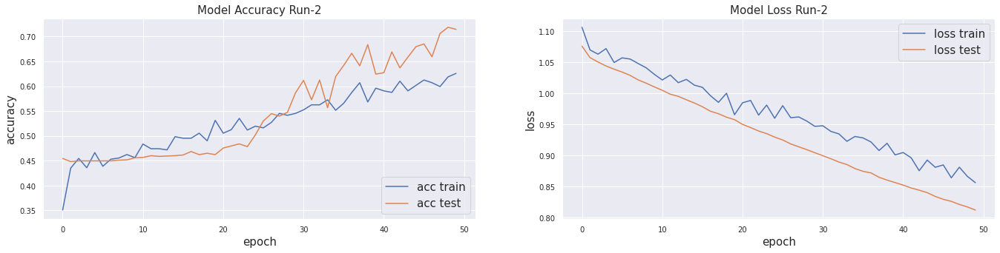

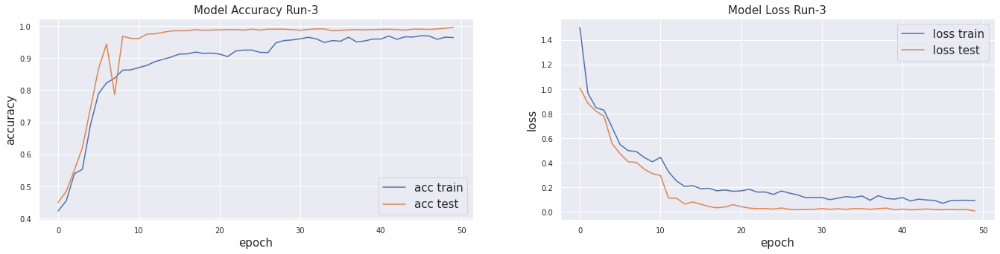

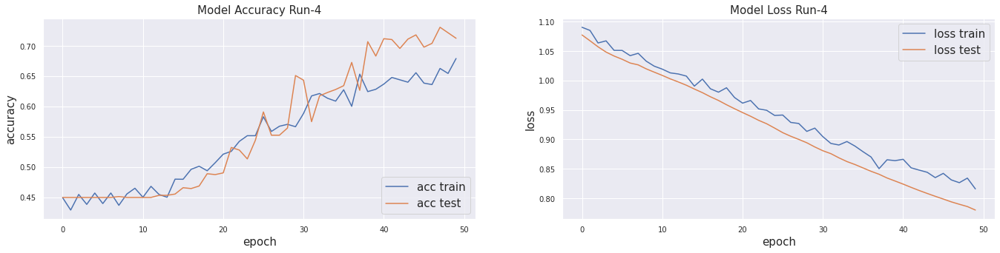

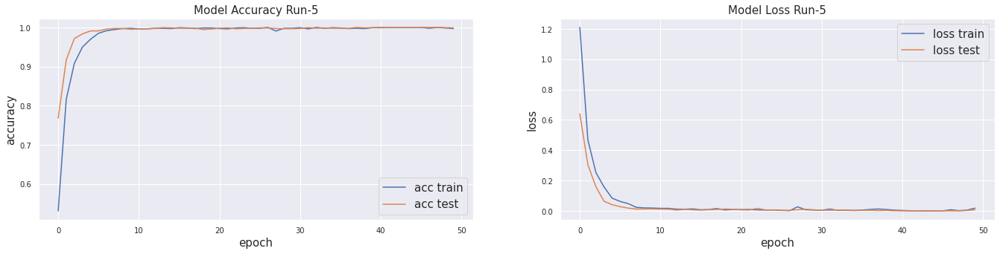

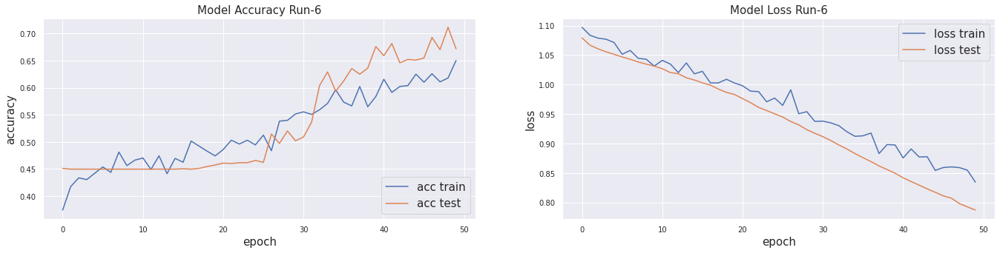

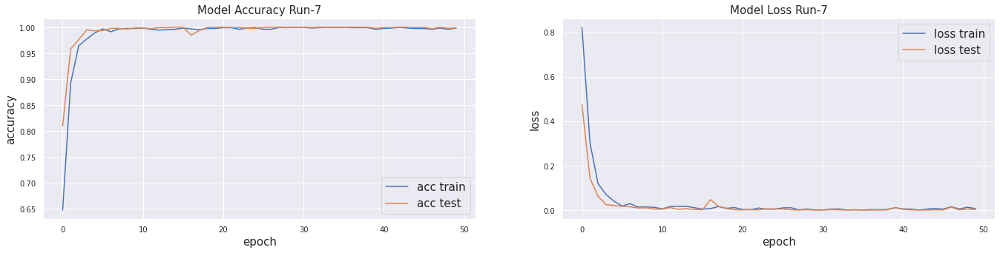

In [ ]:
for key, history_dict in second_history_dict.items():
    plt.figure(figsize = (23,5))

    plt.subplot(1, 2, 1)
    plt.xticks(fontsize='10')
    plt.yticks(fontsize='10')
    plt.plot(history_dict['accuracy'])
    plt.plot(history_dict['val_accuracy'])
    plt.title(f'Model Accuracy Run-{key}', fontsize=15)
    plt.ylabel('accuracy', fontsize=15)
    plt.xlabel('epoch', fontsize=15)
    plt.legend(['acc train', 'acc test'], loc='lower right', fontsize=15)

    plt.subplot(1, 2, 2)
    plt.xticks(fontsize='10')
    plt.yticks(fontsize='10')
    plt.plot(history_dict['loss'])
    plt.plot(history_dict['val_loss'])
    plt.title(f'Model Loss Run-{key}', fontsize=15)
    plt.ylabel('loss', fontsize=15)
    plt.xlabel('epoch', fontsize=15)
    plt.legend(['loss train', 'loss test'], loc='upper right', fontsize=15)
    plt.show()

In [ ]:
for key, trained_model in second_model_dict.items():
        Y_pred = trained_model.predict_generator(test_gen)
        y_pred = np.argmax(Y_pred, axis=1)

        print(f"Model Run-{key}")
        target_names = []

        for key in train_gen.class_indices:
                target_names.append(key)
        print(classification_report(test_gen.classes, y_pred, target_names=target_names))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  


Model Run-0
              precision    recall  f1-score   support

       covid       0.88      0.71      0.79        21
      normal       0.70      0.64      0.67        22
   pneumonia       0.72      0.85      0.78        34

    accuracy                           0.75        77
   macro avg       0.77      0.73      0.75        77
weighted avg       0.76      0.75      0.75        77



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  


Model Run-1
              precision    recall  f1-score   support

       covid       1.00      1.00      1.00        21
      normal       1.00      1.00      1.00        22
   pneumonia       1.00      1.00      1.00        34

    accuracy                           1.00        77
   macro avg       1.00      1.00      1.00        77
weighted avg       1.00      1.00      1.00        77



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  


Model Run-2
              precision    recall  f1-score   support

       covid       0.93      0.67      0.78        21
      normal       0.91      0.45      0.61        22
   pneumonia       0.63      0.94      0.75        34

    accuracy                           0.73        77
   macro avg       0.82      0.69      0.71        77
weighted avg       0.79      0.73      0.72        77



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  


Model Run-3
              precision    recall  f1-score   support

       covid       1.00      0.81      0.89        21
      normal       0.85      1.00      0.92        22
   pneumonia       1.00      1.00      1.00        34

    accuracy                           0.95        77
   macro avg       0.95      0.94      0.94        77
weighted avg       0.96      0.95      0.95        77



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  


Model Run-4
              precision    recall  f1-score   support

       covid       0.93      0.67      0.78        21
      normal       0.82      0.41      0.55        22
   pneumonia       0.63      0.94      0.75        34

    accuracy                           0.71        77
   macro avg       0.79      0.67      0.69        77
weighted avg       0.77      0.71      0.70        77



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  


Model Run-5
              precision    recall  f1-score   support

       covid       1.00      1.00      1.00        21
      normal       1.00      1.00      1.00        22
   pneumonia       1.00      1.00      1.00        34

    accuracy                           1.00        77
   macro avg       1.00      1.00      1.00        77
weighted avg       1.00      1.00      1.00        77



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  


Model Run-6
              precision    recall  f1-score   support

       covid       0.93      0.67      0.78        21
      normal       0.90      0.41      0.56        22
   pneumonia       0.63      0.97      0.77        34

    accuracy                           0.73        77
   macro avg       0.82      0.68      0.70        77
weighted avg       0.79      0.73      0.71        77



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  


Model Run-7
              precision    recall  f1-score   support

       covid       1.00      1.00      1.00        21
      normal       1.00      1.00      1.00        22
   pneumonia       1.00      1.00      1.00        34

    accuracy                           1.00        77
   macro avg       1.00      1.00      1.00        77
weighted avg       1.00      1.00      1.00        77



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  after removing the cwd from sys.path.


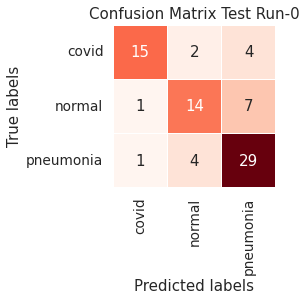

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  after removing the cwd from sys.path.


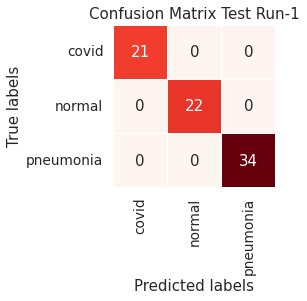

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  after removing the cwd from sys.path.


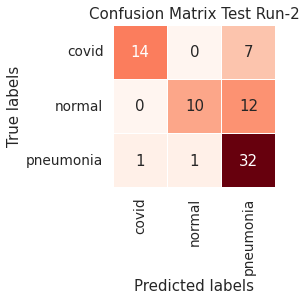

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  after removing the cwd from sys.path.


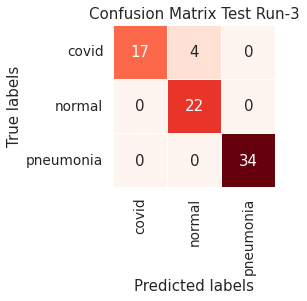

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  after removing the cwd from sys.path.


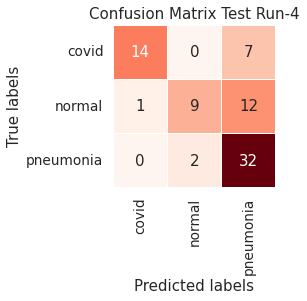

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  after removing the cwd from sys.path.


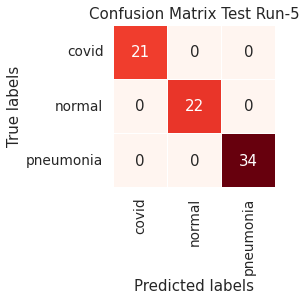

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  after removing the cwd from sys.path.


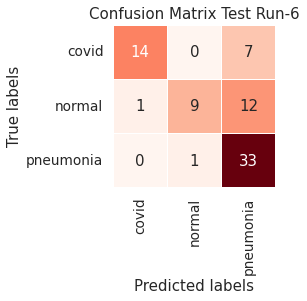

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  after removing the cwd from sys.path.


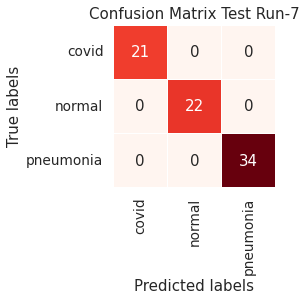

In [ ]:
labels = ['covid', 'normal', 'pneumonia']

for key, trained_model in second_model_dict.items():
    Y_pred = trained_model.predict_generator(test_gen)
    y_pred = np.argmax(Y_pred, axis=1)

    Cmatrix_test = confusion_matrix(test_gen.classes, y_pred)

    plt.figure(figsize=(3,3))
    ax = plt.subplot()

    data = np.asarray(Cmatrix_test).reshape(3,3)

    sns.set(font_scale=1.25)
    sns.heatmap(data,
                annot=True,
                ax=ax,
                cmap=plt.cm.Reds,
                square=True,
                cbar=False,
                linewidths=.5,
                xticklabels=labels, yticklabels=labels
                )

    ax.set_xlabel('Predicted labels')
    ax.set_ylabel('True labels')
    ax.set_title('Confusion Matrix')
    plt.title(f'Confusion Matrix Test Run-{key}')
    plt.show()

# Tensorboard Visualization

In [ ]:
%tensorboard --logdir '/content/drive/MyDrive/1. Colab Notebooks/semester 7/Pembelajaran Mesin/kegiatan praktikum (benar)/modul 4/HParams summary'

<IPython.core.display.Javascript object>

## Kegiatan 2 **(berkelompok)**
30 poin

**Ketentuan Wajib**
* Tulis dokumentasi tugas kelompok anda dalam file README.md
* Cek daftar dataset seluruh praktikan [disini](https://docs.google.com/spreadsheets/d/1qyu5AVDhPhegpRTbNaDoq5qXX4_CX09Q7tYyD-fkF_c/edit?usp=sharing)
* Seluruh data dan progress pengerjaan tugas kelompok harus berada dalam github repository sebelum praktikum dimulai
* Tidak diperbolehkan berganti anggota kelompok selama satu semester ini
* Tidak diperbolehkan berganti repository selama mengerjakan tugas kelompok ini
* **Tidak diperbolehkan berganti dataset atau jurnal rujukan**
* Pastikan anda menggunakan akun github pribadi untuk melakukan commit dan push

**Penilaian**
* Keaktifan dalam tim
* Kontribusi dalam proyek dan tim
* Penerapan prinsip kerja Agile (sprint backlog dan report terdokumentasikan dengan baik)
* Progress pengerjaan tugas kelompok
* Problem solving masing - masing anggota terhadap kendala yang dialami
* Pemahaman masing - masing anggota tim terhadap tugas yang dikerjakan
* Pendokumentasian proyek "clear and clean documentation"

**Materi pendukung**
* [Project documentation](https://realpython.com/documenting-python-code)
* [Github readme](https://docs.github.com/en/github/writing-on-github/getting-started-with-writing-and-formatting-on-github/basic-writing-and-formatting-syntax)
* [Sprint backlog](https://www.lucidchart.com/blog/how-to-develop-a-product-backlog-in-agile)

**Tugas**

Melanjutkan tugas kelompok di modul 1 sampai 3 sekarang kerjakan beberapa poin berikut untuk didemokan kepada asisten masing-masing.

*   Melakukan proses preprocessing dataset dengan ketentuan:
 * augmentasi data menggunakan ImageDataGenerator
 * balancing dataset menggunakan teknik oversampling / downsampling
 * splitting dataset menjadi (75% train, 14% validation, 1% test)
*   Melakukan training beberapa skema model menggunakan model CNN sederhana buatan sendiri **(minimal 2 model)** *tidak diperbolehkan menggunakan transfer learning* 
 * Menerapkan proses Convolution
 * Menerapkan proses Pooling
 * Menerapkan Dropout
 * Menerpakan BatchNormalization
 * Menerapkan learning rate scheduller
 * Menggunakan hyperparameter tuning
 * Minimal 100 epoch per model
* Menyimpan model yang telah di training kedalam file `.json` dan weight kedalam file `.h5` [Lihat disini](https://www.tensorflow.org/guide/keras/save_and_serialize)
*  Mencatat hasil perkembangan tugas kelompok dalam file `sprint_project.xlsx` tandai masing-masing task dengan status **Done** *untuk task yang telah selesai dikerjakan*, **On Going** *untuk task yang dalam proses pengerjaan*, **Waiting** *untuk task yang belum atau akan dikerjakan*
* Pastikan anda menulis tanggal mulai dan tanggal selesai masing-masing task dengan benar
* Pastikan anda menulis penanggung jawab masing-masing task (Penanggung jawab bertugas menyelesaikan dan menuntaskan masing-masing task yang diberikan)
* `commit` dan `push` seluruh perkerjaan yang anda lakukan kedalam branch pribadi dalam repository tugas kelompok yang telah anda buat sebelumnya.
* Presentasikan kepada asisten tentang apa yang anda lakukakan selama mengerjakan tugas kelompok ini. Ceritakan tentang tugas masing-masing anggota,  kendala dalam mengerjakan tugas sampai solusi yang anda lakukan saat mengerjakan tugas kelompok ini.

